In [1]:
import sys
sys.path.append('./U-2-Net')

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

In [3]:
from U2Net.data_loader import RescaleT
from U2Net.data_loader import ToTensor
from U2Net.data_loader import ToTensorLab
from U2Net.data_loader import SalObjDataset

In [4]:
from U2Net.model import U2NET 
from U2Net.model import U2NETP 

In [5]:
from IPython.display import display
from PIL import Image as Img

In [6]:
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable

In [7]:
train_df = pd.read_csv('train2.csv')
train_df

,image,species,individual_id,box
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9,2 116 802 665
1,000562241d384d.jpg,humpback_whale,1a71fbb72250,588 597 3504 1477
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b,0 453 3183 1589
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063,1 91 2636 1495
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392,1139 1590 3574 1913
...,...,...,...,...
51028,fff639a7a78b3f.jpg,beluga,5ac053677ed1,NaN
51029,fff8b32daff17e.jpg,cuviers_beaked_whale,1184686361b3,2105 113 2294 157
51030,fff94675cc1aef.jpg,blue_whale,5401612696b9,NaN
51031,fffbc5dd642d8c.jpg,beluga,4000b3d7c24e,NaN


In [8]:
input_path = "cropped_train_images"

In [9]:
train_df.individual_id.value_counts().head(10)

37c7aba965a5    400
114207cab555    168
a6e325d8e924    155
19fbb960f07d    154
c995c043c353    153
f195c38bcf17    146
ce6e37904aa4    145
ffbb4e585ff2    145
281504409737    143
bc1eb2241633    141
Name: individual_id, dtype: int64

In [10]:
img_to_draw = [ input_path + '/' + file for file in train_df.query("individual_id == '281504409737'").sample(25).image]

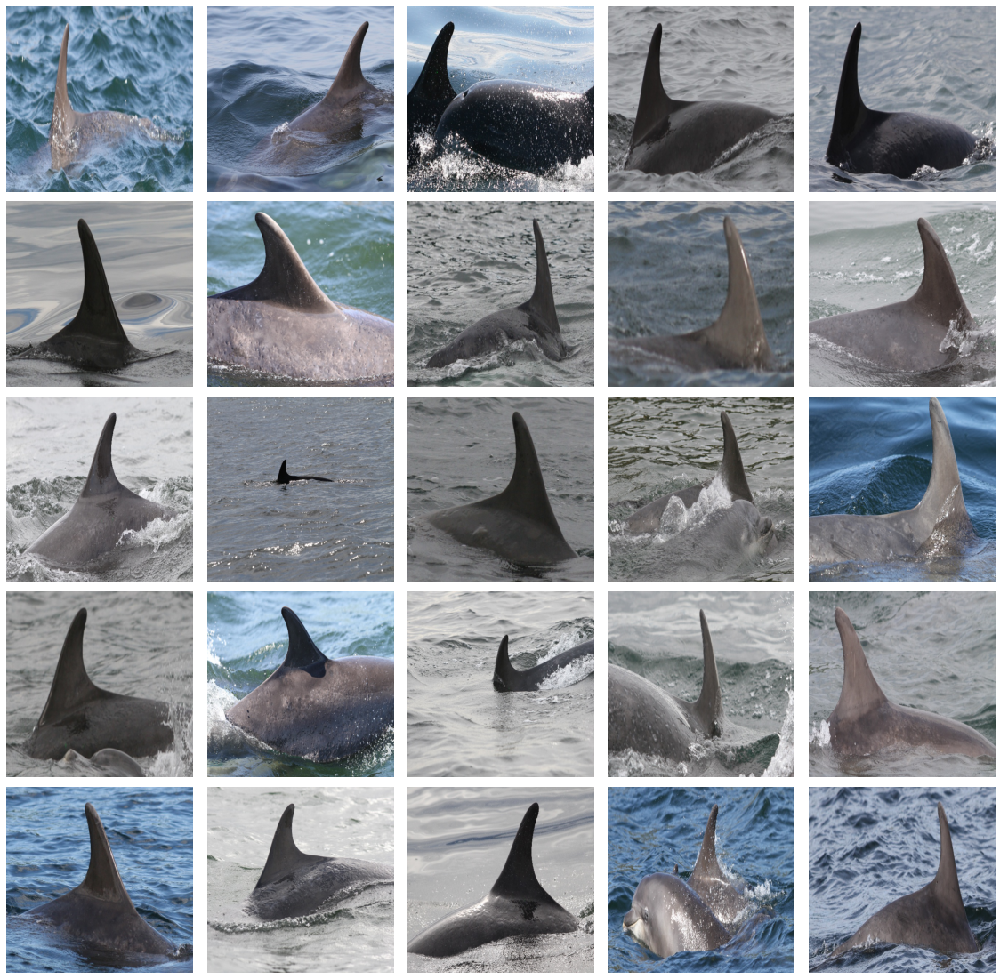

In [11]:
fig, axes = plt.subplots(5, 5, figsize=(20,20))

for idx, img in enumerate(img_to_draw):
    i = idx % 5 
    j = idx // 5
    image = Img.open(img)
    iar_shp = np.array(image).shape
    axes[i, j].axis('off')
    axes[i, j].imshow(image)
    
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [12]:
THRESHOLD = 0.3

In [13]:
def normPRED(d):
    ma = torch.max(d)
    mi = torch.min(d)
    dn = (d-mi)/(ma-mi)
    return dn


def pred_unet(model, imgs):
    
    test_salobj_dataset = SalObjDataset(img_name_list = imgs, lbl_name_list = [], transform = transforms.Compose([RescaleT(320),ToTensorLab(flag=0)]))
    test_salobj_dataloader = DataLoader(test_salobj_dataset, batch_size=1, shuffle=False, num_workers = 1)
    
    for i_test, data_test in enumerate(test_salobj_dataloader):
        
        inputs_test = data_test['image']
        inputs_test = inputs_test.type(torch.FloatTensor)

        if torch.cuda.is_available():
            inputs_test = Variable(inputs_test.cuda())
        else:
            inputs_test = Variable(inputs_test)

        d1, d2, d3, d4, d5, d6, d7 = net(inputs_test)

        predict = d5[:,0,:,:]
        predict = normPRED(predict)
        
        del d1, d2, d3, d4, d5, d6, d7

        predict = predict.squeeze()
        predict_np = predict.cpu().data.numpy()

        # Masked image - using threshold you can soften/sharpen mask boundaries
        predict_np[predict_np > THRESHOLD] = 1
        predict_np[predict_np <= THRESHOLD] = 0
        mask = Img.fromarray(predict_np*255).convert('RGB')
        image = Img.open(imgs[0])
        imask = mask.resize((image.width, image.height), resample=Img.BILINEAR)
        back = Img.new("RGB", (image.width, image.height), (255, 255, 255))
        mask = imask.convert('L')
        im_out = Img.composite(image, back, mask)
        
        # Sailient mask 
        salient_mask = np.array(image)
        mask_layer = np.array(imask)        
        mask_layer[mask_layer == 255] = 50 # offest on RED channel
        salient_mask[:,:,0] += mask_layer[:,:, 0]
        salient_mask = np.clip(salient_mask, 0, 255) 
    
    return np.array(im_out), np.array(image), np.array(salient_mask), np.array(mask)

In [14]:
UNET2_SMALL = False

In [15]:
%%capture

if UNET2_SMALL:
    model_dir = "./U2Net/u2netp.pth"  # Faster ... a lot (!) but less accurate
    net = U2NETP(3,1) 
else:
    model_dir = "./U2Net/u2net.pth"
    net = U2NET(3,1) 


if torch.cuda.is_available():
    net.load_state_dict(torch.load(model_dir))
    net.cuda()
else:        
    net.load_state_dict(torch.load(model_dir, map_location=torch.device('cpu')))

net.eval()

/Users/caracao/opt/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"
/Users/caracao/opt/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:3704: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")
/Users/caracao/opt/anaconda3/lib/python3.9/site-packages/torch/nn/functional.py:1944: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


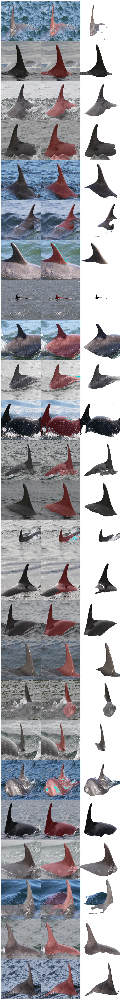

In [16]:
fig, axes = plt.subplots(25, 1, figsize=(600,200))

for idx, img in enumerate(img_to_draw):
    image, im_oryg, sal_map, mask = pred_unet(net, [img_to_draw[idx]]) 
    result = np.concatenate((im_oryg, sal_map, image), axis=1)
    result_img = Img.fromarray(result)
    axes[idx].axis('off')
    axes[idx].imshow(result_img)

plt.subplots_adjust(wspace=0.05, hspace=0)
plt.show()

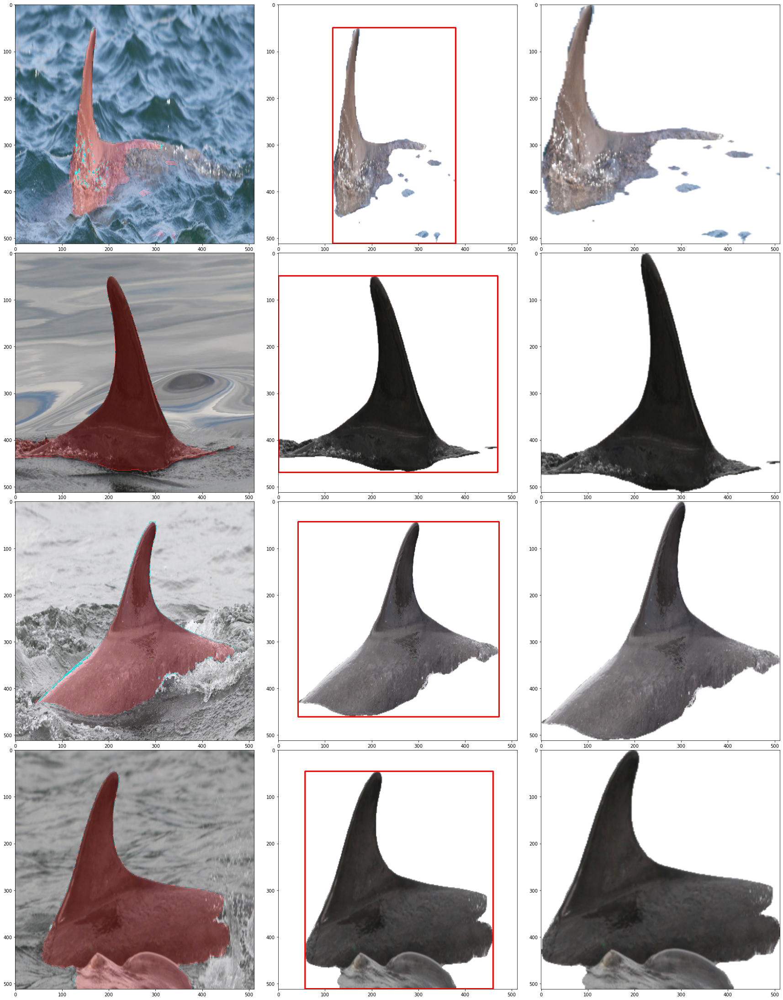

In [17]:
fig, axes = plt.subplots(4, 3, figsize=(30,40))

for idx, img in enumerate(img_to_draw):
    
    if idx > 3:
        break
        
    image, im_oryg, sal_map, mask = pred_unet(net, [img_to_draw[idx]])
    
    ymin = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][0]
    ymax = np.nonzero((mask[:] != 0).argmax(axis = 1))[0][-1]
    xmin = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][0]
    xmax = np.nonzero((mask[:] != 0).argmax(axis = 0))[0][-1]
    
    img = cv2.rectangle(image.copy(), (xmin, ymin), (xmax, ymax), (255,0,0), 2)
    
    crop_img = image[ymin:ymax, xmin:xmax]
    crop_img = cv2.resize(crop_img, (image.shape[0], image.shape[1]), interpolation = cv2.INTER_AREA)
    
    result = np.concatenate((img, crop_img), axis=1)
    result_img = Img.fromarray(result)
    
    axes[idx, 0].imshow(Img.fromarray(sal_map))
    axes[idx, 1].imshow(Img.fromarray(img))
    axes[idx, 2].imshow(Img.fromarray(crop_img))

plt.subplots_adjust(wspace=0.1, hspace=0)
plt.show()